<a href="https://colab.research.google.com/github/nahlasadaldeen/datasets/blob/master/Copy_of_MURA_abnormality_detection_nahla.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# MURA | Abnormality detection - Notebook 2/2

Notebook 1/2 : https://github.com/piegu/fastai-projects/blob/master/MURA_abnormality_detection.ipynb

- Author: [Pierre Guillou](https://www.linkedin.com/in/pierreguillou)
- Date: March 2019
- MURA Dataset: https://stanfordmlgroup.github.io/competitions/mura/
- Ref: [Fastai v1](https://docs.fast.ai/) (Deep Learning library on PyTorch)
- Post in medium: https://medium.com/@pierre_guillou/2-2-fastai-the-new-radiology-tool-9f0b7db7bf91

## What is MURA?

MURA (musculoskeletal radiographs) is a large dataset of bone X-rays. Algorithms are tasked with determining whether an X-ray study is normal or abnormal.

Musculoskeletal conditions affect more than 1.7 billion people worldwide, and are the most common cause of severe, long-term pain and disability, with 30 million emergency department visits annually and increasing. We hope that our dataset can lead to significant advances in medical imaging technologies which can diagnose at the level of experts, towards improving healthcare access in parts of the world where access to skilled radiologists is limited.

MURA is one of the largest public radiographic image datasets. We're making this dataset available to the community and hosting a competition to see if your models can perform as well as radiologists on the task.

## Initialisation

In [ ]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [ ]:
from fastai.vision import *
from fastai.widgets import *
import shutil

In [ ]:
from fastai.callbacks import * 

In [ ]:
import fastai
print(f'fastai: {fastai.__version__}')
print(f'cuda: {torch.cuda.is_available()}')

In [ ]:
import gc
import torch

## Data

### Data path

In [ ]:
Config.data_path()

In [ ]:
 ! wget https://cs.stanford.edu/group/mlgroup/MURA-v1.1.zip
 ! unzip -q MURA-v1.1.zip
 ! ls
 shutil.move("/content/MURA-v1.1", "/root/.fastai/data/MURA-v1.1") 

In [ ]:
path = Config.data_path() / 'MURA-v1.1'
path.ls()

### csv

In [ ]:
df_train = pd.read_csv(path / 'train_image_paths.csv', header=None, names=['image'])
df_train.image[0]

In [ ]:
df_valid = pd.read_csv(path / 'valid_image_paths.csv', header=None, names=['image'])
df_valid.image[0]

In [ ]:
df_train_label = pd.read_csv(path / 'train_labeled_studies.csv', header=None, names=['image', 'label'])
df_train_label.head()

### Create folder data2 to train models

In [ ]:
# Create data2 with data to train our models
path_train = path / 'data2/train'
path_valid = path / 'data2/valid'
path_train.mkdir(parents=True, exist_ok=True)
path_valid.mkdir(parents=True, exist_ok=True)

In [ ]:
path_train_neg = path_train / '0'
path_train_pos = path_train / '1'
path_train_neg.mkdir(parents=True, exist_ok=True)
path_train_pos.mkdir(parents=True, exist_ok=True)

path_valid_neg = path_valid / '0'
path_valid_pos = path_valid / '1'
path_valid_neg.mkdir(parents=True, exist_ok=True)
path_valid_pos.mkdir(parents=True, exist_ok=True)

### Get list of images

In [ ]:
fnames_train = get_image_files(path/'train', recurse=True)
print(len(fnames_train))
fnames_train[:5]

In [ ]:
fnames_valid = get_image_files(path/'valid', recurse=True)
print(len(fnames_valid))
fnames_valid[:5]

### Copy images into data2

In [ ]:
pat_label = re.compile(r'/XR_([^/]+)/[^/]+/[^/]+/[^/]+.png$')
pat_patient = re.compile(r'/[^/]+/patient([^/]+)/[^/]+/[^/]+.png$')
pat_study = re.compile(r'/[^/]+/[^/]+/([^/]+)/[^/]+.png$')
# pat_study_negpos = re.compile(r'\\[^\\]+\\[^\\]+\\study\d+_([^\\]+)\\[^\\]+.png$')

In [ ]:
%%time
# copy all train images in corresponding class folders under MURA-v1.1/data2/train
for src in fnames_train:
    # get image label
    label = pat_label.search(str(src))
    label = label.group(1)
    # get patient number
    patient = pat_patient.search(str(src))
    patient = patient.group(1)
    # get study name
    study = pat_study.search(str(src))
    study = study.group(1)  
    # create class folder if necessary
    if 'negative' in study:
        path_label = path_train_neg
    else:
        path_label = path_train_pos
    # copy image to its class folder
    img_name = label + '_patient' + patient + '_' + study + '_' + src.name
    dest = path_label / img_name
    shutil.copy(str(src), str(dest))

In [ ]:
%%time
# copy all valid images in corresponding class folders under MURA-v1.1/data2/valid
for src in fnames_valid:
    # get image label
    label = pat_label.search(str(src))
    label = label.group(1)
    # get patient number
    patient = pat_patient.search(str(src))
    patient = patient.group(1)
    # get study name
    study = pat_study.search(str(src))
    study = study.group(1)  
    # create class folder if necessary
    if 'negative' in study:
        path_label = path_valid_neg
    else:
        path_label = path_valid_pos
    # copy image to its class folder
    img_name = label + '_patient' + patient + '_' + study + '_' + src.name
    dest = path_label / img_name
    shutil.copy(str(src), str(dest))

### Number of studies 

In [ ]:
pat_label = re.compile(r'/XR_([^/]+)/[^/]+/[^/]+/[^/]+.png$')
pat_patient = re.compile(r'/[^/]+/patient([^/]+)/[^/]+/[^/]+.png$')
pat_study = re.compile(r'/([^/]+)_[^/]+/[^/]+.png$')

In [ ]:
mura = ['elbow', 'finger', 'forearm', 'hand', 'humerus', 'shoulder', 'wrist']

study_train_dict = dict()
study_valid_dict = dict()

for m in mura:
    study_train_dict[m] = list()
    study_valid_dict[m] = list()
    
for src in fnames_train:
    # get image label
    label = pat_label.search(str(src))
    label = label.group(1)
    # get patient number
    patient = pat_patient.search(str(src))
    patient = patient.group(1)
    # get study name
    study = pat_study.search(str(src))
    study = study.group(1)
    # add to label list
    s = 'patient' + patient + '_' + study
    study_train_dict[label.lower()].append(s)

for src in fnames_valid:
    # get image label
    label = pat_label.search(str(src))
    label = label.group(1)
    # get patient number
    patient = pat_patient.search(str(src))
    patient = patient.group(1)
    # get study name
    study = pat_study.search(str(src))
    study = study.group(1)
    # add to label list
    s = 'patient' + patient + '_' + study
    study_valid_dict[label.lower()].append(s)

In [ ]:
num_train_studies = 0
num_valid_studies = 0

for m in mura:
    # train
    myset = set(study_train_dict[m])
    num_train_studies += len(myset)
    # valid
    myset = set(study_valid_dict[m])
    num_valid_studies += len(myset)

In [ ]:
# 207 studies in test
num_train_studies, num_valid_studies, num_train_studies + num_valid_studies + 207

## Training with resnet18 (parameters from paper)

###  Input images size = 112x112

In [ ]:
learn = None
gc.collect()

In [ ]:
torch.cuda.empty_cache()

In [ ]:
size = 112
bs = 8

np.random.seed(42)
data = ImageDataBunch.from_folder(path/'data2', ds_tfms=get_transforms(max_rotate=30.0, max_warp=0.), 
                                  size=size, bs=bs, 
                                  ).normalize(imagenet_stats)

In [ ]:
kappa = KappaScore()
kappa.weights = "quadratic"

In [ ]:
print(models)

In [ ]:
learn = cnn_learner(data, models.resnet18, metrics=[error_rate, accuracy, kappa], wd=0.1)

In [ ]:
learn.lr_find()

epoch,train_loss,valid_loss,error_rate,accuracy,kappa_score,time


/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:3103: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and now uses scale_factor directly, instead of relying on the computed output size. If you wish to restore the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  warnings.warn("The default behavior for interpolate/upsample with float scale_factor changed "
/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:3103: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and now uses scale_factor directly, instead of relying on the computed output size. If you wish to restore the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  warnings.warn("The default behavior for interpola

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


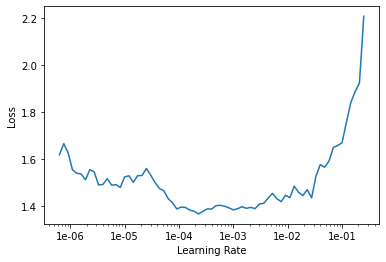

In [ ]:
learn.recorder.plot()

In [ ]:
lr = 1e-4
learn.fit_one_cycle(5,max_lr=lr,callbacks=[ShowGraph(learn),SaveModelCallback(learn)])

epoch,train_loss,valid_loss,error_rate,accuracy,kappa_score,time


Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:3103: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and now uses scale_factor directly, instead of relying on the computed output size. If you wish to restore the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  warnings.warn("The default behavior for interpolate/upsample with float scale_factor changed "
/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:3103: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and now uses scale_factor directly, instead of relying on the computed output size. If you wish to restore the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 


Buffered data was truncated after reaching the output size limit.

In [ ]:
learn.save('resnet18-stage-1-n2')

In [ ]:
learn.load('resnet18-stage-1-n2');

In [ ]:
learn.lr_find()

epoch,train_loss,valid_loss,error_rate,accuracy,kappa_score,time


/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:3103: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and now uses scale_factor directly, instead of relying on the computed output size. If you wish to restore the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  warnings.warn("The default behavior for interpolate/upsample with float scale_factor changed "
/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:3103: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and now uses scale_factor directly, instead of relying on the computed output size. If you wish to restore the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  warnings.warn("The default behavior for interpola

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


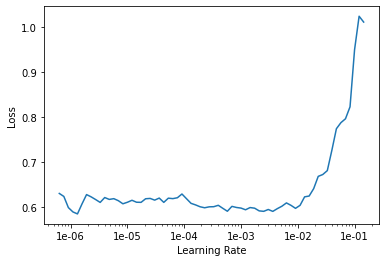

In [ ]:
learn.recorder.plot()

In [ ]:
lr = 1e-2
learn.fit_one_cycle(5,max_lr=lr,callbacks=[ShowGraph(learn),SaveModelCallback(learn)])

epoch,train_loss,valid_loss,error_rate,accuracy,kappa_score,time


Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:3103: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and now uses scale_factor directly, instead of relying on the computed output size. If you wish to restore the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  warnings.warn("The default behavior for interpolate/upsample with float scale_factor changed "
/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:3103: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and now uses scale_factor directly, instead of relying on the computed output size. If you wish to restore the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 


Buffered data was truncated after reaching the output size limit.

In [ ]:
learn.save('resnet18-stage-2-n2')

In [ ]:
learn.load('resnet18-stage-2-n2');

epoch,train_loss,valid_loss,error_rate,accuracy,kappa_score,time
0,1.246651,57.340080,0.478261,0.521739,0.000682,10:57
1,2.903595,1.663709,0.478574,0.521426,0.000000,08:12
2,1.372048,0.703998,0.521426,0.478574,0.000000,08:06
3,0.822785,1.188620,0.478574,0.521426,0.000000,08:28
4,0.670905,0.702213,0.478574,0.521426,0.000000,08:21


Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:3103: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and now uses scale_factor directly, instead of relying on the computed output size. If you wish to restore the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  warnings.warn("The default behavior for interpolate/upsample with float scale_factor changed "
/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:3103: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and now uses scale_factor directly, instead of relying on the computed output size. If you wish to restore the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 


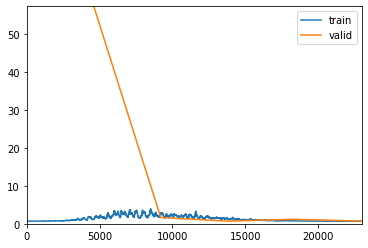

Better model found at epoch 0 with valid_loss value: 57.34008026123047.


Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:3103: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and now uses scale_factor directly, instead of relying on the computed output size. If you wish to restore the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  warnings.warn("The default behavior for interpolate/upsample with float scale_factor changed "
/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:3103: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and now uses scale_factor directly, instead of relying on the computed output size. If you wish to restore the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 


Better model found at epoch 1 with valid_loss value: 1.663709044456482.


Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:3103: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and now uses scale_factor directly, instead of relying on the computed output size. If you wish to restore the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  warnings.warn("The default behavior for interpolate/upsample with float scale_factor changed "
/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:3103: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and now uses scale_factor directly, instead of relying on the computed output size. If you wish to restore the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 


Better model found at epoch 2 with valid_loss value: 0.7039978504180908.


Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:3103: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and now uses scale_factor directly, instead of relying on the computed output size. If you wish to restore the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  warnings.warn("The default behavior for interpolate/upsample with float scale_factor changed "
/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:3103: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and now uses scale_factor directly, instead of relying on the computed output size. If you wish to restore the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 


Better model found at epoch 4 with valid_loss value: 0.7022125720977783.


In [ ]:
lr = 1e-1
learn.fit_one_cycle(5,max_lr=lr,callbacks=[ShowGraph(learn),SaveModelCallback(learn)])

In [ ]:
learn.save('resnet18-stage-3-n2')

#### Unfreeze

In [ ]:
learn.purge()
learn.unfreeze()

In [ ]:
learn.lr_find()

epoch,train_loss,valid_loss,error_rate,accuracy,kappa_score,time


/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:3103: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and now uses scale_factor directly, instead of relying on the computed output size. If you wish to restore the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  warnings.warn("The default behavior for interpolate/upsample with float scale_factor changed "
/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:3103: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and now uses scale_factor directly, instead of relying on the computed output size. If you wish to restore the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  warnings.warn("The default behavior for interpola

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


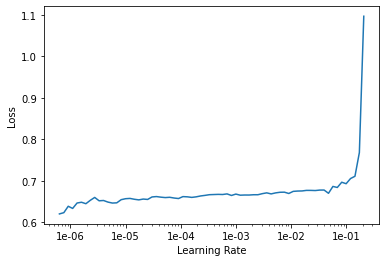

In [ ]:
learn.recorder.plot()

In [ ]:
lr=4e-6
learn.fit_one_cycle(5,max_lr=slice(lr/100,lr),callbacks=[ShowGraph(learn),SaveModelCallback(learn)])

epoch,train_loss,valid_loss,error_rate,accuracy,kappa_score,time


Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:3103: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and now uses scale_factor directly, instead of relying on the computed output size. If you wish to restore the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  warnings.warn("The default behavior for interpolate/upsample with float scale_factor changed "
/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:3103: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and now uses scale_factor directly, instead of relying on the computed output size. If you wish to restore the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 


Buffered data was truncated after reaching the output size limit.

In [ ]:
learn.save('resnet18-stage-4-n2')

#### Results by image

In [ ]:
size = 112
bs = 8

np.random.seed(42)
data = ImageDataBunch.from_folder(path/'data2', ds_tfms=get_transforms(max_rotate=30.0, max_warp=0.), 
                                  size=size, bs=bs, 
                                  ).normalize(imagenet_stats)

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:3103: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and now uses scale_factor directly, instead of relying on the computed output size. If you wish to restore the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  warnings.warn("The default behavior for interpolate/upsample with float scale_factor changed "
/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:3103: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and now uses scale_factor directly, instead of relying on the computed output size. If you wish to restore the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  warnings.warn("The default behavior for interpola

In [ ]:
kappa = KappaScore()
kappa.weights = "quadratic"

In [ ]:
learn = cnn_learner(data, models.resnet18, metrics=[error_rate, accuracy, kappa], wd=0.1)

In [ ]:
learn.load('resnet18-stage-4-n2');

In [ ]:
interp = ClassificationInterpretation.from_learner(learn)

losses,idxs = interp.top_losses()

len(data.valid_ds)==len(losses)==len(idxs)

Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:3103: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and now uses scale_factor directly, instead of relying on the computed output size. If you wish to restore the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  warnings.warn("The default behavior for interpolate/upsample with float scale_factor changed "
/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:3103: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and now uses scale_factor directly, instead of relying on the computed output size. If you wish to restore the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 


True

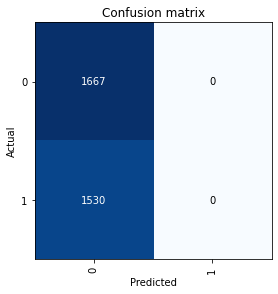

In [ ]:
# first interpretation
interp.plot_confusion_matrix()

In [ ]:
interp.most_confused(min_val=2)

[('1', '0', 1530)]

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:3103: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and now uses scale_factor directly, instead of relying on the computed output size. If you wish to restore the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  warnings.warn("The default behavior for interpolate/upsample with float scale_factor changed "
/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:3103: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and now uses scale_factor directly, instead of relying on the computed output size. If you wish to restore the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  warnings.warn("The default behavior for interpola

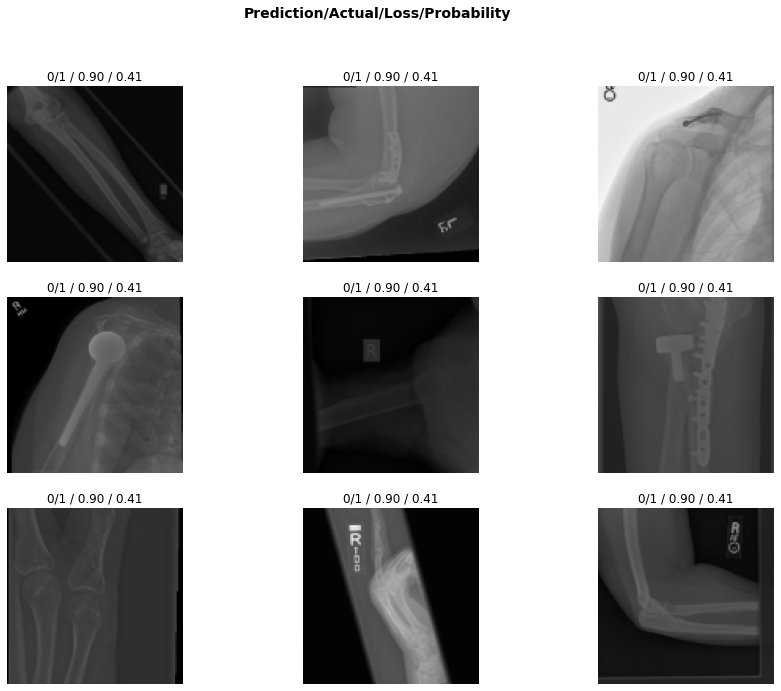

In [ ]:
interp.plot_top_losses(9, figsize=(15,11))

#### Accuracy and kappa by study

Source for kappa score calculation: [Cohen's kappa in plain English](https://stats.stackexchange.com/questions/82162/cohens-kappa-in-plain-english)

In [ ]:
learn.load('resnet18-stage-4-n2');

In [ ]:
for img_url in data.valid_ds.x.items:
    print(img_url)
    break

/root/.fastai/data/MURA-v1.1/data2/valid/1/FINGER_patient11369_study1_positive_image3.png


In [ ]:
# predictions on validation
preds_val, y_val = learn.get_preds()

Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:3103: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and now uses scale_factor directly, instead of relying on the computed output size. If you wish to restore the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  warnings.warn("The default behavior for interpolate/upsample with float scale_factor changed "
/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:3103: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and now uses scale_factor directly, instead of relying on the computed output size. If you wish to restore the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 


In [ ]:
# file to save 
file = path / 'results_resnet18_112.csv'

In [ ]:
%%time
probs_of_images_by_studies = dict()
num_img_by_studies = dict()
labels_of_studies = dict()
num_studies_by_label = dict()
list_studies_by_label = dict()
idx_by_studies = dict()
results_by_label = dict()
acc_by_label = OrderedDict()
kappa_score = OrderedDict()

pat_label = re.compile(r'/([^/]+)_patient[^/]+.png$')
pat_study = re.compile(r'/([^/]+)_[^_]+.png$')

for idx, src in enumerate(data.valid_ds.x.items):
    # get label name
    label = pat_label.search(str(src))
    label = label.group(1) 
    # get study name
    study = pat_study.search(str(src))
    study = study.group(1) 
    # sum probabilities by study
    if study in probs_of_images_by_studies:
        probs_of_images_by_studies[study] += preds_val[idx,:].clone()
        num_img_by_studies[study] += 1
        idx_by_studies[study].append(idx)
    else:
        probs_of_images_by_studies[study] = preds_val[idx,:].clone()
        num_img_by_studies[study] = 1
        labels_of_studies[study] = label
        idx_by_studies[study] = [idx]
        
for m in mura:
    num_studies_by_label[m] = sum([1 for k,v in labels_of_studies.items() if v.lower() == m])
    list_studies_by_label[m] = [k for k,v in labels_of_studies.items() if v.lower() == m]
    
for m in mura:
    list_studies = list_studies_by_label[m]
    TN, FP, TP, FN = 0, 0, 0, 0
    for study in list_studies:
        preds_val2 = preds_val.clone()
        idxs = idx_by_studies[study]
        preds = preds_val2[idxs]
        y_hat = np.argmax(preds, axis=1)
        y = y_val[idxs]
        if 'negative' in study:
            TN += sum(y_hat.numpy() == y.numpy())
            FP += sum(y_hat.numpy() != y.numpy())
        else:
            TP += sum(y_hat.numpy() == y.numpy())
            FN += sum(y_hat.numpy() != y.numpy())
    results_by_label[m] = [TN, FP, TP, FN]
    # accuracy
    acc_by_label[m] = (TN + TP) / (TN+FP+FN+TP)
    # kappa
    ground_truth_neg = TN+FN
    ground_truth_pos = FP+TP
    classifier_neg = TN+FP
    classifier_pos = FN+TP
    total = classifier_neg + classifier_pos
    observed_accuracy = (TN + TP) / total
    expected_accuracy = ((ground_truth_neg * classifier_neg / total) + (ground_truth_pos * classifier_pos / total)) / total
    kappa_score[m] = (observed_accuracy - expected_accuracy) / (1 - expected_accuracy)

# overall accuracy and kappa
[TN, FP, TP, FN] = [0,0,0,0]
for m in mura:
    results = results_by_label[m]
    TN += results[0]
    FP += results[1]
    TP += results[2]
    FN += results[3]
# overall accuracy 
acc_by_label['overall'] = (TN + TP) / (TN+FP+FN+TP)
# overall kappa
ground_truth_neg = TN+FN
ground_truth_pos = FP+TP
classifier_neg = TN+FP
classifier_pos = FN+TP
total = classifier_neg + classifier_pos
observed_accuracy = (TN + TP) / total
expected_accuracy = ((ground_truth_neg * classifier_neg / total) + (ground_truth_pos * classifier_pos / total)) / total
kappa_score['overall'] = (observed_accuracy - expected_accuracy) / (1 - expected_accuracy)

# Create DataFrame
for k, v in acc_by_label.items():
    acc_by_label[k] = round(v, 3)
for k, v in kappa_score.items():
    kappa_score[k] = round(v, 3)
    
df = pd.DataFrame([acc_by_label, kappa_score], index =['accuracy', 'kappa']) 
df.name = 'Results on validation at a study level'
df = df.transpose()

# save df
df.to_csv(file,header=True)

print(df)

          accuracy  kappa
elbow        0.505    0.0
finger       0.464    0.0
forearm      0.498    0.0
hand         0.589    0.0
humerus      0.514    0.0
shoulder     0.506    0.0
wrist        0.552    0.0
overall      0.521    0.0
CPU times: user 262 ms, sys: 11.1 ms, total: 273 ms
Wall time: 336 ms


### Check overall accuracy and kappa

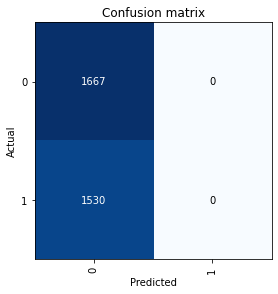

In [ ]:
# first interpretation
interp.plot_confusion_matrix()

In [ ]:
cm = interp.confusion_matrix()

TN = cm[0,0]
FP = cm[0,1]
FN = cm[1,0]
TP = cm[1,1]

In [ ]:
# accuracy
acc = (TN + TP) / (TN+FP+FN+TP)

# kappa
ground_truth_neg = TN+FN
ground_truth_pos = FP+TP
classifier_neg = TN+FP
classifier_pos = FN+TP
total = classifier_neg + classifier_pos
observed_accuracy = (TN + TP) / total
expected_accuracy = ((ground_truth_neg * classifier_neg / total) + (ground_truth_pos * classifier_pos / total)) / total
kappa_score = (observed_accuracy - expected_accuracy) / (1 - expected_accuracy)

round(acc,3), round(kappa_score,3)

(0.521, 0.0)

### Input images size = 320x320

In [ ]:
learn = None
gc.collect()

In [ ]:
torch.cuda.empty_cache()

In [ ]:
size = 320
bs = 8

np.random.seed(42)
data = ImageDataBunch.from_folder(path/'data2', ds_tfms=get_transforms(max_rotate=30.0, max_warp=0.), 
                                  size=size, bs=bs, 
                                  ).normalize(imagenet_stats)

In [ ]:
kappa = KappaScore()
kappa.weights = "quadratic"

In [ ]:
learn = cnn_learner(data, models.densenet169, metrics=[error_rate, accuracy, kappa], wd=0.1)
learn.load('densenet169-stage-4-n2');

In [ ]:
# freeze the model
learn.purge()
learn.freeze()

In [ ]:
learn.lr_find()

In [ ]:
learn.recorder.plot()

In [ ]:
lr = 2e-4
learn.fit_one_cycle(5,max_lr=lr,callbacks=[ShowGraph(learn),SaveModelCallback(learn, monitor='kappa_score', mode='max')])

In [ ]:
learn.save('densenet169-stage-5-n2')

In [ ]:
learn = None
gc.collect()
torch.cuda.empty_cache()

In [ ]:
learn = cnn_learner(data, models.densenet169, metrics=[error_rate, accuracy, kappa], wd=0.1)
learn.load('densenet169-stage-5-n2');

In [ ]:
learn.lr_find()

In [ ]:
learn.recorder.plot()

In [ ]:
lr = 2e-4
learn.fit_one_cycle(5,max_lr=lr,callbacks=[ShowGraph(learn),SaveModelCallback(learn, monitor='kappa_score', mode='max')])

In [ ]:
learn.save('densenet169-stage-6-n2')

#### bs = 16 (to go a bit faster in training)

In [ ]:
learn = None
gc.collect()

In [ ]:
torch.cuda.empty_cache()

In [ ]:
size = 320
bs = 16

np.random.seed(42)
data = ImageDataBunch.from_folder(path/'data2', ds_tfms=get_transforms(max_rotate=30.0, max_warp=0.), 
                                  size=size, bs=bs, 
                                  ).normalize(imagenet_stats)

In [ ]:
kappa = KappaScore()
kappa.weights = "quadratic"

In [ ]:
learn = cnn_learner(data, models.densenet169, metrics=[error_rate, accuracy, kappa], wd=0.1)
learn.load('densenet169-stage-6-n2');

In [ ]:
learn.lr_find()

In [ ]:
learn.recorder.plot()

In [ ]:
lr = 2e-5
learn.fit_one_cycle(5,max_lr=lr,callbacks=[ShowGraph(learn),SaveModelCallback(learn, monitor='kappa_score', mode='max')])

In [ ]:
learn.save('densenet169-stage-7-n2')

In [ ]:
lr = 2e-6
learn.fit_one_cycle(5,max_lr=lr,callbacks=[ShowGraph(learn),SaveModelCallback(learn, monitor='kappa_score', mode='max')])

In [ ]:
learn.save('densenet169-stage-8-n2')

#### Unfreeze

In [ ]:
learn = None
gc.collect()

In [ ]:
torch.cuda.empty_cache()

In [ ]:
size = 320
bs = 16

np.random.seed(42)
data = ImageDataBunch.from_folder(path/'data2', ds_tfms=get_transforms(max_rotate=30.0, max_warp=0.), 
                                  size=size, bs=bs, 
                                  ).normalize(imagenet_stats)

In [ ]:
kappa = KappaScore()
kappa.weights = "quadratic"

In [ ]:
learn = cnn_learner(data, models.densenet169, metrics=[error_rate, accuracy, kappa], wd=0.1)
learn.load('densenet169-stage-8-n2');

In [ ]:
learn.purge()
learn.unfreeze()

In [ ]:
learn.lr_find()

In [ ]:
learn.recorder.plot()

In [ ]:
lr=3e-5
learn.fit_one_cycle(5,max_lr=slice(lr/100,lr),callbacks=[ShowGraph(learn),SaveModelCallback(learn, monitor='kappa_score', mode='max')])

In [ ]:
learn.save('densenet169-stage-9-n2')

In [ ]:
learn.lr_find()

In [ ]:
learn.recorder.plot()

In [ ]:
doc(learn.loss_func)

#### Results by image

In [ ]:
size = 320
bs = 8

np.random.seed(42)
data = ImageDataBunch.from_folder(path/'data2', ds_tfms=get_transforms(max_rotate=30.0, max_warp=0.), 
                                  size=size, bs=bs, 
                                  ).normalize(imagenet_stats)

In [ ]:
kappa = KappaScore()
kappa.weights = "quadratic"

In [ ]:
learn = cnn_learner(data, models.densenet169, metrics=[error_rate, accuracy, kappa], wd=0.1)

In [ ]:
learn.load('densenet169-stage-9-n2');

In [ ]:
interp = ClassificationInterpretation.from_learner(learn)

losses,idxs = interp.top_losses()

len(data.valid_ds)==len(losses)==len(idxs)

In [ ]:
# first interpretation
interp.plot_confusion_matrix()

In [ ]:
interp.most_confused(min_val=2)

In [ ]:
interp.plot_top_losses(9, figsize=(15,11))

#### Accuracy and kappa by study

Source for kappa score calculation: [Cohen's kappa in plain English](https://stats.stackexchange.com/questions/82162/cohens-kappa-in-plain-english)

In [ ]:
learn.load('densenet169-stage-9-n2');

In [ ]:
for img_url in data.valid_ds.x.items:
    print(img_url)
    break

In [ ]:
# predictions on validation
preds_val, y_val = learn.get_preds()

In [ ]:
# file to save df
file = path / 'results_densenet169_320.csv'

In [ ]:
%%time
probs_of_images_by_studies = dict()
num_img_by_studies = dict()
labels_of_studies = dict()
num_studies_by_label = dict()
list_studies_by_label = dict()
idx_by_studies = dict()
results_by_label = dict()
acc_by_label = OrderedDict()
kappa_score = OrderedDict()

pat_label = re.compile(r'/([^/]+)_patient[^/]+.png$')
pat_study = re.compile(r'/([^/]+)_[^_]+.png$')

for idx, src in enumerate(data.valid_ds.x.items):
    # get label name
    label = pat_label.search(str(src))
    label = label.group(1) 
    # get study name
    study = pat_study.search(str(src))
    study = study.group(1) 
    # sum probabilities by study
    if study in probs_of_images_by_studies:
        probs_of_images_by_studies[study] += preds_val[idx,:].clone()
        num_img_by_studies[study] += 1
        idx_by_studies[study].append(idx)
    else:
        probs_of_images_by_studies[study] = preds_val[idx,:].clone()
        num_img_by_studies[study] = 1
        labels_of_studies[study] = label
        idx_by_studies[study] = [idx]
        
for m in mura:
    num_studies_by_label[m] = sum([1 for k,v in labels_of_studies.items() if v.lower() == m])
    list_studies_by_label[m] = [k for k,v in labels_of_studies.items() if v.lower() == m]
    
for m in mura:
    list_studies = list_studies_by_label[m]
    TN, FP, TP, FN = 0, 0, 0, 0
    for study in list_studies:
        preds_val2 = preds_val.clone()
        idxs = idx_by_studies[study]
        preds = preds_val2[idxs]
        y_hat = np.argmax(preds, axis=1)
        y = y_val[idxs]
        if 'negative' in study:
            TN += sum(y_hat.numpy() == y.numpy())
            FP += sum(y_hat.numpy() != y.numpy())
        else:
            TP += sum(y_hat.numpy() == y.numpy())
            FN += sum(y_hat.numpy() != y.numpy())
    results_by_label[m] = [TN, FP, TP, FN]
    # accuracy
    acc_by_label[m] = (TN + TP) / (TN+FP+FN+TP)
    # kappa
    ground_truth_neg = TN+FN
    ground_truth_pos = FP+TP
    classifier_neg = TN+FP
    classifier_pos = FN+TP
    total = classifier_neg + classifier_pos
    observed_accuracy = (TN + TP) / total
    expected_accuracy = ((ground_truth_neg * classifier_neg / total) + (ground_truth_pos * classifier_pos / total)) / total
    kappa_score[m] = (observed_accuracy - expected_accuracy) / (1 - expected_accuracy)

# overall accuracy and kappa
[TN, FP, TP, FN] = [0,0,0,0]
for m in mura:
    results = results_by_label[m]
    TN += results[0]
    FP += results[1]
    TP += results[2]
    FN += results[3]
# overall accuracy 
acc_by_label['overall'] = (TN + TP) / (TN+FP+FN+TP)
# overall kappa
ground_truth_neg = TN+FN
ground_truth_pos = FP+TP
classifier_neg = TN+FP
classifier_pos = FN+TP
total = classifier_neg + classifier_pos
observed_accuracy = (TN + TP) / total
expected_accuracy = ((ground_truth_neg * classifier_neg / total) + (ground_truth_pos * classifier_pos / total)) / total
kappa_score['overall'] = (observed_accuracy - expected_accuracy) / (1 - expected_accuracy)

# Create DataFrame
for k, v in acc_by_label.items():
    acc_by_label[k] = round(v, 3)
for k, v in kappa_score.items():
    kappa_score[k] = round(v, 3)
    
df = pd.DataFrame([acc_by_label, kappa_score], index =['accuracy', 'kappa']) 
df.name = 'Results on validation at a study level'
df = df.transpose()

# save df
df.to_csv(file,header=True)

print(df)

#### Check overall accuracy and kappa

In [ ]:
# first interpretation
interp.plot_confusion_matrix()

In [ ]:
cm = interp.confusion_matrix()

TN = cm[0,0]
FP = cm[0,1]
FN = cm[1,0]
TP = cm[1,1]

In [ ]:
# accuracy
acc = (TN + TP) / (TN+FP+FN+TP)

# kappa
ground_truth_neg = TN+FN
ground_truth_pos = FP+TP
classifier_neg = TN+FP
classifier_pos = FN+TP
total = classifier_neg + classifier_pos
observed_accuracy = (TN + TP) / total
expected_accuracy = ((ground_truth_neg * classifier_neg / total) + (ground_truth_pos * classifier_pos / total)) / total
kappa_score = (observed_accuracy - expected_accuracy) / (1 - expected_accuracy)

round(acc,3), round(kappa_score,3)